# Image Classifier to Predict Flower Type from Images

## - Jayabharathi Hari(https://www.jayabharathi-hari.com/)

• **Dataset** : Import from TFlearn.datasets

• **DOMAIN**: Botanical Research

• **CONTEXT**: University X is currently undergoing some research involving understanding the characteristics of flowers. They already have
have invested on curating sample images. They require an automation which can create a classifier capable of determining a flower’s
species from a photo.

• **DATA DESCRIPTION**: The dataset comprises of images from 17 plant species.
• PROJECT OBJECTIVE: To experiment with various approaches to train an image classifier to predict type of flower from the image.




• **DOMAIN**: Botanical Research

• **CONTEXT**: University X is currently undergoing some research involving understanding the characteristics of flowers. They already have
have invested on curating sample images. They require an automation which can create a classifier capable of determining a flower’s
species from a photo.

• **DATA DESCRIPTION**: The dataset comprises of images from 17 plant species.

• **PROJECT OBJECTIVE**: To experiment with various approaches to train an image classifier to predict type of flower from the image.

In [1]:
#Mounting the Google drive
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
pip install tflearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.3/107.3 kB 773.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for tflearn: filename=tflearn-0.5.0-py3-none-any.whl size=127283 sha256=928961279386d48a00649c346957d73002eed3d027b245326cdf8366516678b6
  Stored in directory: /root/.cache/pip/wheels/55/fb/7b/e06204a0ceefa45443930b9a250cb5ebe31def0e4e8245a465
Successfully built tflearn


In [3]:
!pip install tensorflow==2.10.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 578.1/578.1 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 17.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 49.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 54.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 33.9 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.15.0
    Uninstalling tensorflow-estimator-2.15.0:
      Successfully uninstalled tensorflow-estimator-2

In [4]:
#Importing all packages
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

import tensorflow as tf
import tflearn.datasets.oxflower17 as DF # Importing dataset

from PIL import Image , ImageFilter # Image handling Library
import cv2 # Image handling Library

Instructions for updating:
non-resource variables are not supported in the long term


In [5]:
tf.__version__ #Checking tensorflow version

'2.10.1'

In [6]:
X,y = DF.load_data(one_hot= True) #Loading dataset

100.0% 60276736 / 60270631


Succesfully downloaded 17flowers.tgz 60270631 bytes.
File Extracted
Starting to parse images...
Parsing Done!


In [7]:
!ls -l

total 12
drwxr-xr-x 3 root root 4096 Jan 22 23:05 17flowers
drwx------ 5 root root 4096 Jan 22 23:02 gdrive
drwxr-xr-x 1 root root 4096 Jan 19 14:20 sample_data


In [8]:
project_path = "/content/17flowers/jpg"
img_size = 224
img_depth = 3
X_new =[]
y_new = []

In [9]:
os.chdir(project_path)

In [10]:
os.listdir()

['4',
 '9',
 'files.txt',
 '2',
 '11',
 '7',
 '0',
 '12',
 '10',
 '6',
 '15',
 '14',
 '1',
 '8',
 '5',
 '13',
 '16',
 '3',
 'files.txt~']

In [11]:
#Making list for easy traverse
l = os.listdir()
l.remove("files.txt")
l.remove("files.txt~")
print(l)

['4', '9', '2', '11', '7', '0', '12', '10', '6', '15', '14', '1', '8', '5', '13', '16', '3']


In [12]:
#Loading data from CWD
for i in l:
  #print(i)
  for j in os.listdir(i):
    #print(project_path + '/' + i + '/' + j)
    temp = cv2.imread(project_path + '/' + i + '/' + j)
    temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
    temp_resize = cv2.resize(temp, (img_size, img_size))
    X_new.append(temp_resize)
    y_new.append(i)

In [13]:
X_new = np.array(X_new)
print("Dimesions of data : ", X_new.shape)

Dimesions of data :  (1360, 224, 224, 3)


In [14]:
y_new = np.array(y_new)
print("Dimesions of labels : ", y_new.shape)

Dimesions of labels :  (1360,)


In [15]:
print("Image size : ", X_new[0].shape)

Image size :  (224, 224, 3)


In [16]:
y_new[:5]

array(['4', '4', '4', '4', '4'], dtype='<U2')

# 2. Preprocess the data.

In [17]:
#Below code is to Split the data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.2, shuffle = True, random_state = 42, stratify = y_new)

In [18]:
print("Dimesions of training data : ", X_train.shape)

Dimesions of training data :  (1088, 224, 224, 3)


In [19]:
print("Dimesions of testing data : ", X_test.shape)

Dimesions of testing data :  (272, 224, 224, 3)


In [20]:
#Below code is to Randomly shuffle the training data
X_train, y_train = shuffle(X_train, y_train)

In [21]:
# Declaring no. of classes variable
num_classes = 17 # 0 - 16
print("No. of Classes : ", num_classes)

No. of Classes :  17


In [22]:
#One hot encoding the train labels
y_train = tf.keras.utils.to_categorical(y_train,num_classes)
#One hot encoding the test labels
y_test = tf.keras.utils.to_categorical(y_test,num_classes)

In [23]:
y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [24]:
#Normalize both the train and test image data from 0-255 to 0-1
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

In [25]:
X_train /= 255
X_test /= 255

In [26]:
#Reshaping the image data
X_train = X_train.reshape(X_train.shape[0],img_size,img_size,img_depth)
X_test = X_test.reshape(X_test.shape[0],img_size,img_size,img_depth)

## Data visualisation:

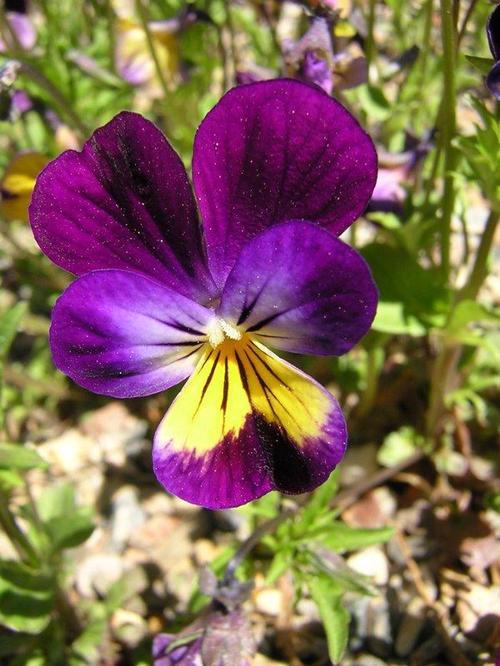

In [27]:
# Opening image for viewing
Image.open('/content/17flowers/jpg/16/image_1291.jpg')

### Display the images.

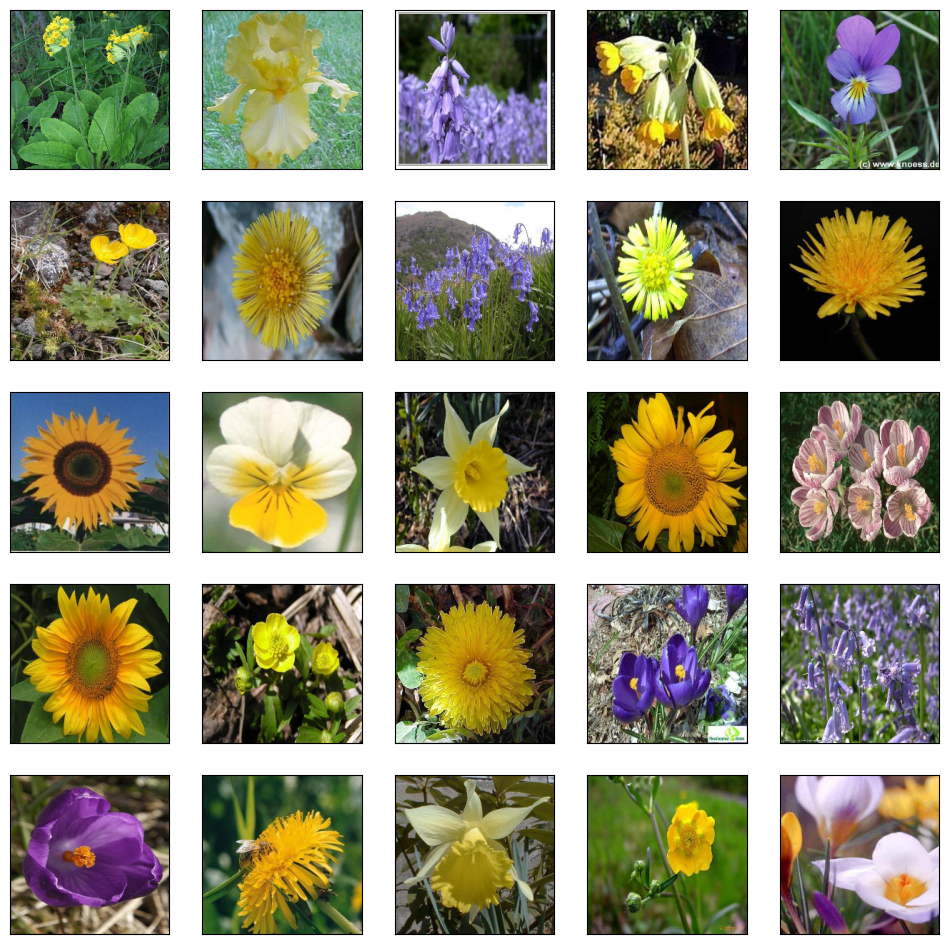

In [28]:
from random import randint
plt.figure(figsize=(12,12)) # plot 25 images
for i in range(25):
    value = randint(0,1360)
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_new[value],cmap=plt.cm.binary)

### Display the labels.

In [29]:

np.unique(y_new)

array(['0', '1', '10', '11', '12', '13', '14', '15', '16', '2', '3', '4',
       '5', '6', '7', '8', '9'], dtype='<U2')

In [30]:
l_new = []
for i in range(0, len(l)):
  l_new.append(int(l[i]))

l_new.sort()
print(l_new)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


In [31]:
classes = ['Daffodil','Snowdrop','LilyValley','Bluebell','Crocus','Iris','Tigerlily','Tulip','Fritillary','Sunflower','Daisy','ColtisFoot','Dandelion','Cowslip','Buttercup','Windflower','Pansy']

In [32]:
# using dictionary comprehension
# to convert lists to dictionary
Labels = {l_new[i]: classes[i] for i in range(len(l_new))}

# Printing resultant dictionary
print ("Labels is : " +  str(Labels))

Labels is : {0: 'Daffodil', 1: 'Snowdrop', 2: 'LilyValley', 3: 'Bluebell', 4: 'Crocus', 5: 'Iris', 6: 'Tigerlily', 7: 'Tulip', 8: 'Fritillary', 9: 'Sunflower', 10: 'Daisy', 11: 'ColtisFoot', 12: 'Dandelion', 13: 'Cowslip', 14: 'Buttercup', 15: 'Windflower', 16: 'Pansy'}


### Display images vs labels.

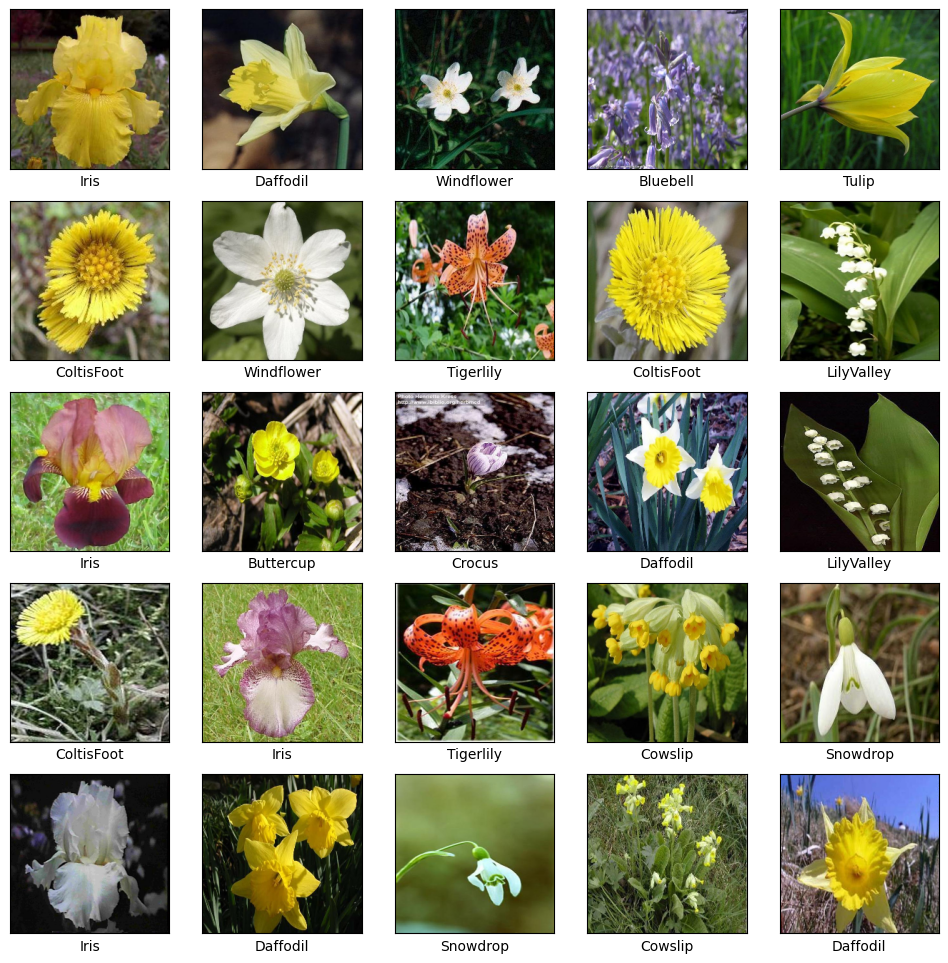

In [33]:
plt.figure(figsize=(12,12)) # plot 25 images
for i in range(25):
    value = randint(0,1360)
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_new[value],cmap=plt.cm.binary)
    plt.xlabel(Labels[int(y_new[value])])

### Apply different filters [ for example: blur, contour, edge detection, emboss, smooth etc.] on the images and display the image.

<ipython-input-34-2ce3b2c97b03>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


Text(0.5, 0, 'Blured')

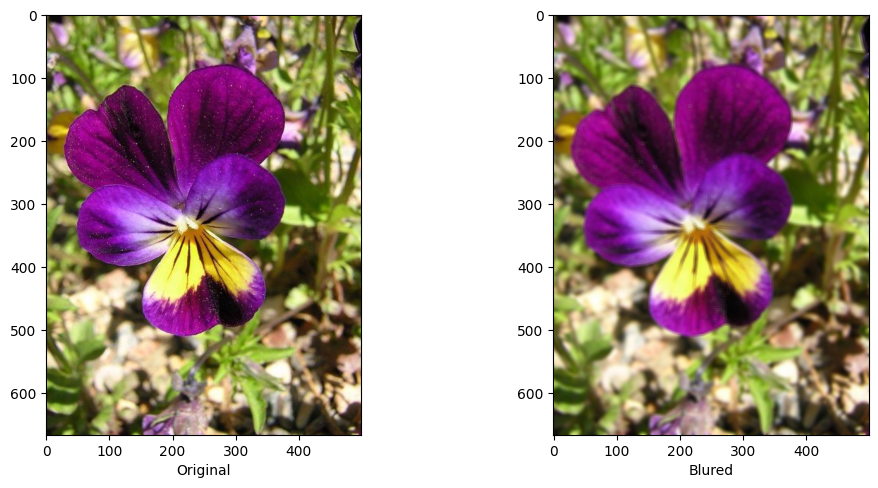

In [34]:
img = Image.open('/content/17flowers/jpg/16/image_1291.jpg')
filtered_img = img.filter(ImageFilter.BLUR)
plt.figure(figsize=(12,12))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.subplot(2,2,1)
plt.imshow(np.asarray(img))
plt.xlabel('Original')
plt.subplot(2,2,2)
plt.imshow(np.asarray(filtered_img))
plt.xlabel('Blured')

<ipython-input-35-c7756aa0c2b0>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


Text(0.5, 0, 'Contoured')

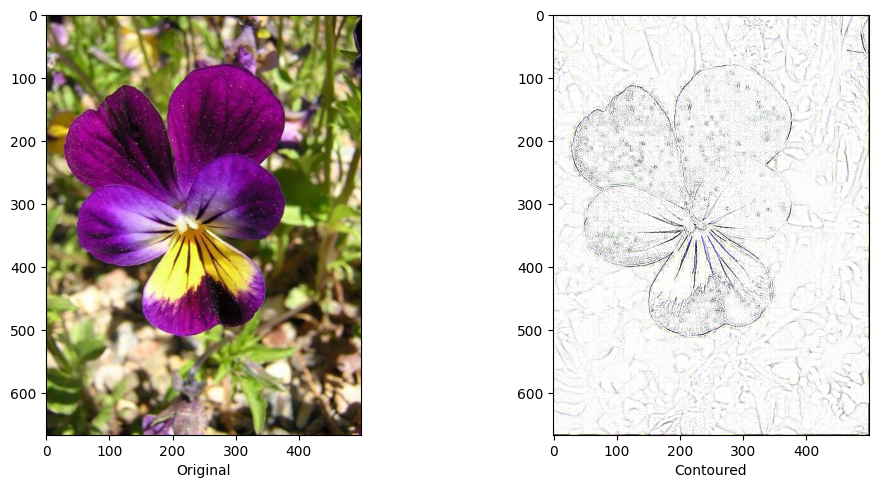

In [35]:
img = Image.open('/content/17flowers/jpg/16/image_1291.jpg')
filtered_img = img.filter(ImageFilter.CONTOUR)
plt.figure(figsize=(12,12))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.subplot(2,2,1)
plt.imshow(np.asarray(img))
plt.xlabel('Original')
plt.subplot(2,2,2)
plt.imshow(np.asarray(filtered_img))
plt.xlabel('Contoured')

<ipython-input-36-294ceacb2339>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


Text(0.5, 0, 'Edge Detection')

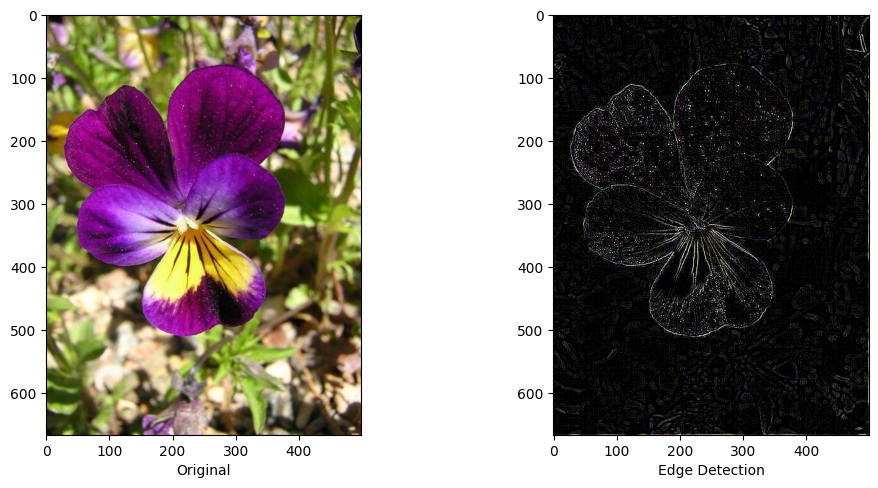

In [36]:
img = Image.open('/content/17flowers/jpg/16/image_1291.jpg')
filtered_img = img.filter(ImageFilter.FIND_EDGES)
plt.figure(figsize=(12,12))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.subplot(2,2,1)
plt.imshow(np.asarray(img))
plt.xlabel('Original')
plt.subplot(2,2,2)
plt.imshow(np.asarray(filtered_img))
plt.xlabel('Edge Detection')

<ipython-input-37-559ba3acaba0>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


Text(0.5, 0, 'Embossed')

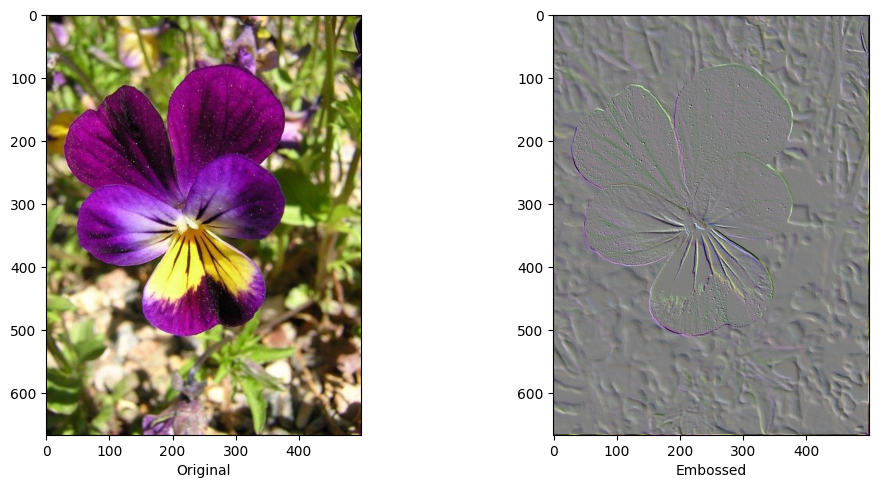

In [37]:
img = Image.open('/content/17flowers/jpg/16/image_1291.jpg')
filtered_img = img.filter(ImageFilter.EMBOSS)
plt.figure(figsize=(12,12))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.subplot(2,2,1)
plt.imshow(np.asarray(img))
plt.xlabel('Original')
plt.subplot(2,2,2)
plt.imshow(np.asarray(filtered_img))
plt.xlabel('Embossed')

<ipython-input-38-377efde9e85b>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


Text(0.5, 0, 'Smoothened')

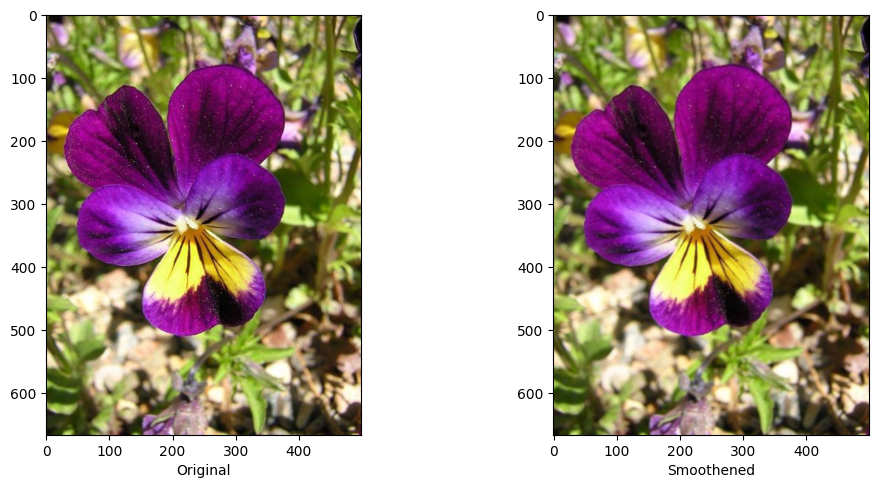

In [38]:
img = Image.open('/content/17flowers/jpg/16/image_1291.jpg')
filtered_img = img.filter(ImageFilter.SMOOTH)
plt.figure(figsize=(12,12))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.subplot(2,2,1)
plt.imshow(np.asarray(img))
plt.xlabel('Original')
plt.subplot(2,2,2)
plt.imshow(np.asarray(filtered_img))
plt.xlabel('Smoothened')

<ipython-input-39-7b290db592e8>:7: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2,2,1)


Text(0.5, 0, 'Sharpened')

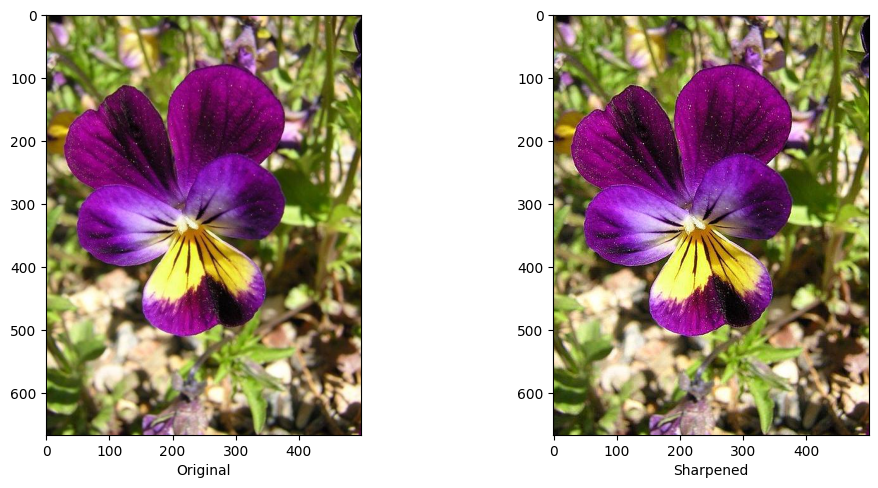

In [39]:
img = Image.open('/content/17flowers/jpg/16/image_1291.jpg')
filtered_img = img.filter(ImageFilter.SHARPEN)
plt.figure(figsize=(12,12))
plt.xticks([])
plt.yticks([])
plt.grid(False)
plt.subplot(2,2,1)
plt.imshow(np.asarray(img))
plt.xlabel('Original')
plt.subplot(2,2,2)
plt.imshow(np.asarray(filtered_img))
plt.xlabel('Sharpened')


# 3. Model training and Tuning:

In [40]:
#Creating DataFrame for storing the accuracies of all different models
col_names = ['Model', 'Accuracy']
resultsdf = pd.DataFrame(columns = col_names)
print(resultsdf)

Empty DataFrame
Columns: [Model, Accuracy]
Index: []


### Use supervised learning algorithms for training.

In [41]:
print("Actual training data shape : ", X_train.shape)

Actual training data shape :  (1088, 224, 224, 3)


In [42]:
print("Actual training label shape : ", y_train.shape)

Actual training label shape :  (1088, 17)


In [43]:
#Flattening the traning data
nsamples, nx, ny, nz = X_train.shape
d2_X_train = X_train.reshape((nsamples,nx*ny*nz))

In [44]:
#Flattening the testing data
nsamples, nx, ny, nz = X_test.shape
d2_X_test = X_test.reshape((nsamples,nx*ny*nz))

In [45]:
print("After flattening training data shape : " ,d2_X_train.shape)

After flattening training data shape :  (1088, 150528)


In [46]:
print("After flattening testing data shape : " ,d2_X_test.shape)

After flattening testing data shape :  (272, 150528)


In [47]:
# Declaring MultinomialNB Classifier
clf = MultinomialNB()

In [48]:
# Training model
clf.fit(d2_X_train,(np.argmax(y_train ,axis=-1)))

MultinomialNB()

In [49]:
# Predicting for all of test dataset
pred = clf.predict(d2_X_test)

print("Accuracy Score of training set: {}".format(accuracy_score(np.argmax(y_train, axis=1),clf.predict(d2_X_train))))
print("Accuracy Score of testing set: {}".format(accuracy_score(np.argmax(y_test, axis=1),pred)))

Accuracy Score of training set: 0.4963235294117647
Accuracy Score of testing set: 0.4007352941176471


Predicition is => 9 : Sunflower


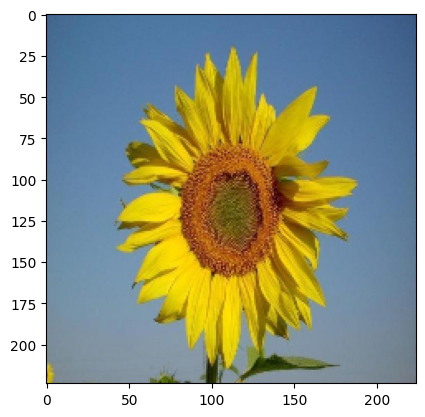

In [50]:
#Predicting for one image and displaying the same
print("Predicition is => {0} : {1}" .format( pred[0], classes[pred[0]]))


flower = X_test[0].reshape(img_size,img_size,3)
plt.imshow(flower, cmap= 'gray')
plt.show()

Text(0.5, 1.0, 'Accuracy Score for MultinomialNB: 0.4007352941176471')

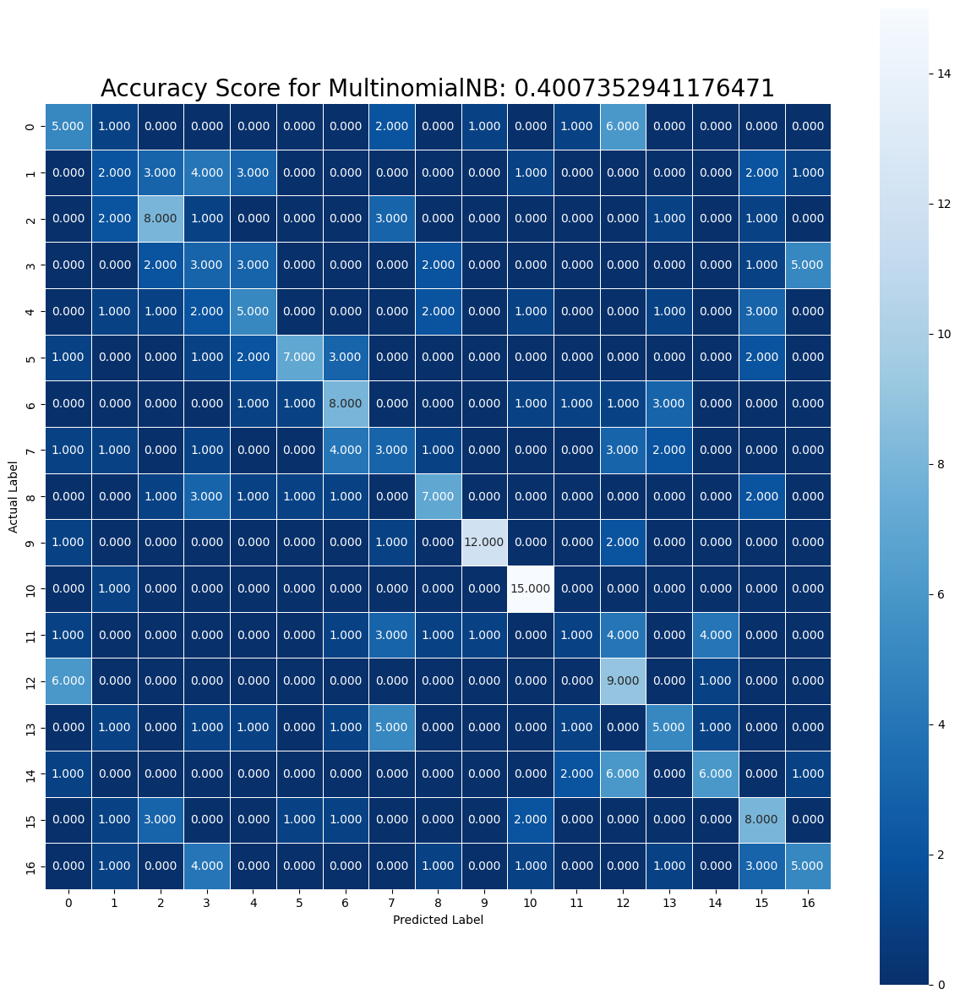

In [51]:
cm = confusion_matrix(np.argmax(y_test, axis=1), pred)
plt.figure(figsize=(15,15))
sns.heatmap(cm, annot = True, fmt = '.3f', linewidths = .5, square = True, cmap='Blues_r')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
all_sample_title = 'Accuracy Score for MultinomialNB: {0}'.format(accuracy_score(np.argmax(y_test, axis=1), pred))
plt.title(all_sample_title, size = 20)

In [52]:
# Classification Report
cr = classification_report(np.argmax(y_test, axis=1),pred)
print(cr)

              precision    recall  f1-score   support

           0       0.31      0.31      0.31        16
           1       0.18      0.12      0.15        16
           2       0.44      0.50      0.47        16
           3       0.15      0.19      0.17        16
           4       0.31      0.31      0.31        16
           5       0.70      0.44      0.54        16
           6       0.42      0.50      0.46        16
           7       0.18      0.19      0.18        16
           8       0.50      0.44      0.47        16
           9       0.86      0.75      0.80        16
          10       0.71      0.94      0.81        16
          11       0.17      0.06      0.09        16
          12       0.29      0.56      0.38        16
          13       0.38      0.31      0.34        16
          14       0.50      0.38      0.43        16
          15       0.36      0.50      0.42        16
          16       0.42      0.31      0.36        16

    accuracy              

In [53]:
# Adding Final accuracy value to Results DataFrame
tempResultsDf = pd.DataFrame({'Model':['MultinomialNB'],'Accuracy': (accuracy_score(np.argmax(y_test, axis=1), pred))},index=[1])
resultsdf = pd.concat([resultsdf, tempResultsDf])
resultsdf

,Model,Accuracy
1,MultinomialNB,0.400735






### Using ImageDataGenerator to avoid the overfitting problem from start for ANN and CNN.

In [54]:
#ImageDataGenerator declaration
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=50,
                                                          width_shift_range=0.1,
                                                          height_shift_range=0.1,
                                                          horizontal_flip=True,
                                                          shear_range=0.2,
                                                          zoom_range=0.2,
                                                          fill_mode="nearest")

# Prepare the generator
datagen.fit(X_train)

#rescale=1./255,
 #     rotation_range=20,
  #    width_shift_range=0.2,
   #   height_shift_range=0.2,
    #  horizontal_flip=True,
     # fill_mode='nearest'

### Use CNN for training.

In [63]:
cnn_batch_size = 32
cnn_epochs = 25

In [64]:
#Clear any existing model in memory
tf.keras.backend.clear_session()

#Initialize model
cnn = tf.keras.models.Sequential()

#Adding first convolutional layer
cnn.add(tf.keras.layers.Conv2D(32, #Number of filters
                               kernel_size=(3,3), #Size of the filter
                               activation='relu',
                               input_shape=(img_size,img_size,img_depth)))

#Add MaxPooling layer 1
cnn.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))

#Adding second convolutional layer
cnn.add(tf.keras.layers.Conv2D(32, #Number of filters
                               kernel_size=(3,3), #Size of the filter
                               activation='relu', padding='same'))

#Add MaxPooling layer 2
cnn.add(tf.keras.layers.MaxPool2D(pool_size=(2,2)))

#Add dropout layer
cnn.add(tf.keras.layers.Dropout(0.25))

#Flatten the output
cnn.add(tf.keras.layers.Flatten())

#Dense layer 1
cnn.add(tf.keras.layers.Dense(256, activation='relu'))

#Add another dropout layer
cnn.add(tf.keras.layers.Dropout(0.25))

#Dense layer 2
cnn.add(tf.keras.layers.Dense(512, activation='relu'))

#Add another dropout layer
cnn.add(tf.keras.layers.Dropout(0.25))

#Dense layer 3
cnn.add(tf.keras.layers.Dense(1024, activation='relu')) #, kernel_regularizer = tf.keras.regularizers.l2( l=0.01)

#Add anoter dropout layer
cnn.add(tf.keras.layers.Dropout(0.25))

#Output layer
cnn.add(tf.keras.layers.Dense(num_classes, activation='softmax'))

# Compile model
#adam_opt = tf.keras.optimizers.Adam(lr=0.00001)
cnn.compile(optimizer=tf.keras.optimizers.RMSprop(lr=2e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_acc', patience=5,verbose=1, mode='auto')
callback_list = [early_stopping]

/usr/local/lib/python3.10/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:140: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [65]:
# Model summary
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 111, 111, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 55, 55, 32)       0         
 2D)                                                             
                                                                 
 dropout (Dropout)           (None, 55, 55, 32)        0         
                                                                 
 flatten (Flatten)           (None, 96800)             0

In [66]:
#Train the model
cnn.fit(datagen.flow(X_train,y_train,batch_size=cnn_batch_size),
                    steps_per_epoch=X_train.shape[0]/32,
                    epochs=cnn_epochs,
                    validation_data=(X_test,y_test),
                    callbacks = callback_list)

Epoch 1/25
34/34 [==============================] - ETA: 0s - batch: 16.5000 - size: 32.0000 - loss: 2.7326 - acc: 0.1048

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


34/34 [==============================] - 116s 3s/step - batch: 16.5000 - size: 32.0000 - loss: 2.7326 - acc: 0.1048 - val_loss: 2.3534 - val_acc: 0.1838
Epoch 2/25
34/34 [==============================] - 114s 3s/step - batch: 16.5000 - size: 32.0000 - loss: 2.3629 - acc: 0.2013 - val_loss: 1.9955 - val_acc: 0.3419
Epoch 3/25
34/34 [==============================] - 109s 3s/step - batch: 16.5000 - size: 32.0000 - loss: 2.0953 - acc: 0.2923 - val_loss: 1.7169 - val_acc: 0.3676
Epoch 4/25
34/34 [==============================] - 110s 3s/step - batch: 16.5000 - size: 32.0000 - loss: 1.9062 - acc: 0.3401 - val_loss: 1.5941 - val_acc: 0.4154
Epoch 5/25
34/34 [==============================] - 108s 3s/step - batch: 16.5000 - size: 32.0000 - loss: 1.7757 - acc: 0.3778 - val_loss: 1.4744 - val_acc: 0.4890
Epoch 6/25
34/34 [==============================] - 116s 3s/step - batch: 16.5000 - size: 32.0000 - loss: 1.6656 - acc: 0.4301 - val_loss: 1.4339 - val_acc: 0.5074
Epoch 7/25
34/34 [=========

In [67]:
# Final evaluation of the model
loss, acc = cnn.evaluate(X_train, y_train, verbose=0)
print('Train Accuracy: %.3f%%' % (acc*100))
print('Train Loss: %.3f'% loss)
print()

loss, acc = cnn.evaluate(X_test, y_test, verbose=0)
print('Test Accuracy: %.3f%%' % (acc*100))
print('Test Loss: %.3f'% loss)

Train Accuracy: 72.978%
Train Loss: 0.766

Test Accuracy: 62.132%
Test Loss: 1.023


In [68]:
# Predicting for all of test dataset
y_pred_cnn = np.argmax(cnn.predict(X_test),axis=-1)
# Label categorical Conversion
y_test_f = np.argmax(y_test,axis=-1)

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Text(0.5, 1.0, 'Accuracy Score for CNN: 0.6213235294117647')

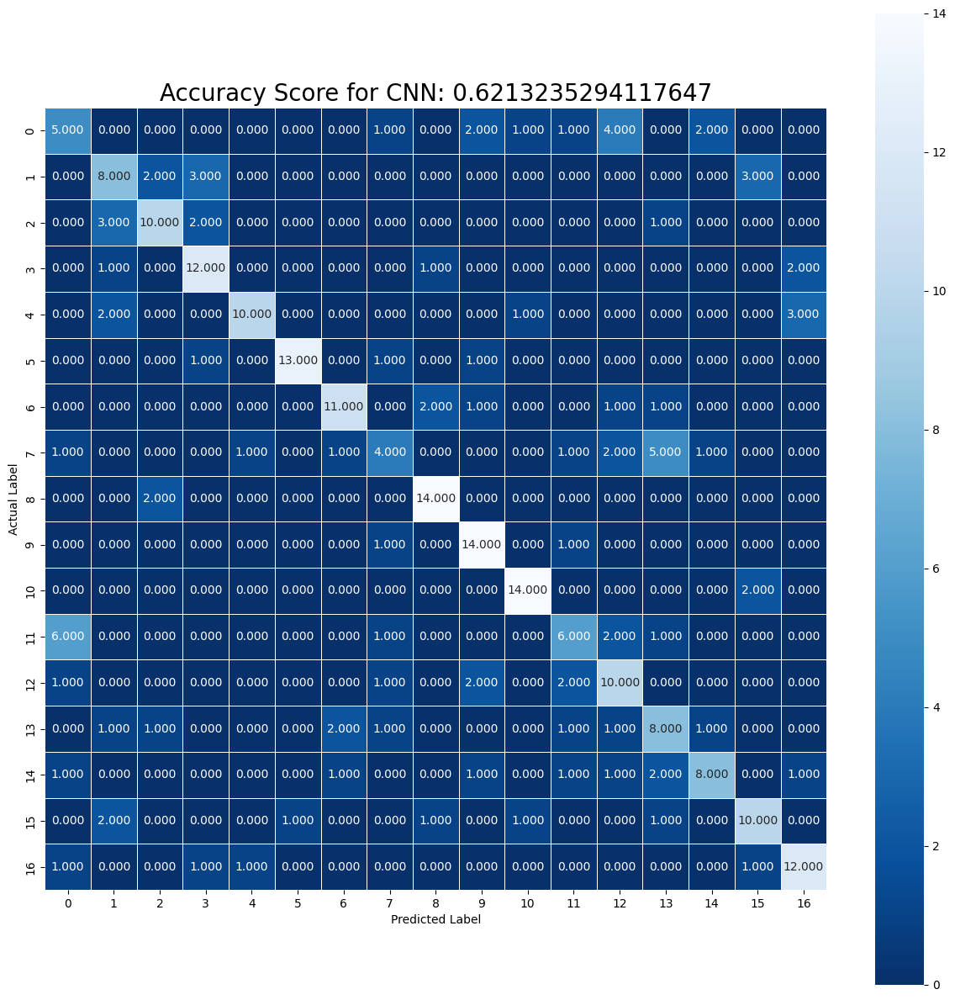

In [69]:
# Confusion Matrix

cm = confusion_matrix(y_test_f,y_pred_cnn)
plt.figure(figsize=(15,15))
sns.heatmap(cm, annot = True, fmt = '.3f', linewidths = .5, square = True, cmap='Blues_r')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
all_sample_title = 'Accuracy Score for CNN: {0}'.format(accuracy_score(y_test_f,y_pred_cnn))
plt.title(all_sample_title, size = 20)

In [70]:
# Adding Final accuracy value to Results DataFrame
tempResultsDf = pd.DataFrame({'Model':['CNN'],'Accuracy': cnn.evaluate(X_test, y_test, verbose=0)[1]},index=[3])
resultsdf = pd.concat([resultsdf, tempResultsDf])
resultsdf

,Model,Accuracy
1,MultinomialNB,0.400735
3,CNN,0.621324


### Use various CNN with transferred learning models for training.

In [71]:
# Preprocessing data again for transfer learning

X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, shuffle = True, random_state = 42, stratify = y_new)

# Randomly shuffle the training data
X_train_new, y_train_new = shuffle(X_train_new, y_train_new)

#One hot encoding the train labels
y_train_new = tf.keras.utils.to_categorical(y_train_new)

#One hot encoding the test labels
y_test_new = tf.keras.utils.to_categorical(y_test_new)

#Function to normalize image according to Model being used
def normalize_data(img):

    #Normalize for ResNet50
    return tf.keras.applications.vgg16.preprocess_input(img)

In [72]:
#Defining ImageDataGenerator for both Training and Test Separately

#Defining Training Data Generator with augmentations
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(featurewise_center=True,
                                                                featurewise_std_normalization=True,
                                                                rotation_range=30,
                                                                width_shift_range=0.1,
                                                                height_shift_range=0.1,
                                                                horizontal_flip=True,
                                                                shear_range=0.2,
                                                                zoom_range=0.2,
                                                                fill_mode="nearest",
                                                                preprocessing_function=normalize_data) #Normalize the data accordingly

#Defining Test Data Generator with NO augmentations
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=normalize_data) #Normalize the data accordingly

# Prepare the training generator
train_datagen.fit(X_train_new)

# Prepare the testing generator
test_datagen.fit(X_test_new)

In [73]:
# Clear any existing model in memory
tf.keras.backend.clear_session()

# Loading Pre-trained model
vgg_conv = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(img_size, img_size, img_depth))


58889256/58889256 [==============================] - 1s 0us/step


In [74]:
print(len(vgg_conv.layers))

19


In [75]:
# Freeze all the layers except for the last layer:
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

In [76]:
vgg_conv.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [77]:
# Create the model
model = tf.keras.models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

In [78]:
# Add new layers
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(1024, activation='relu', kernel_regularizer = tf.keras.regularizers.l1_l2( l1=0.00001,l2=0.00001)))
model.add(tf.keras.layers.Dropout(0.5))
model.add(tf.keras.layers.Dense(num_classes, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 1024)              25691136  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 17)                17425     
                                                                 
Total params: 40,423,249
Trainable params: 32,787,985
Non-trainable params: 7,635,264
_________________________________________________________________


In [79]:
model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.RMSprop(lr=2e-4), # learning rate should be small so previously learned weights don't vanish
              metrics=['acc', 'top_k_categorical_accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:140: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [80]:
# Overall model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 1024)              25691136  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 17)                17425     
                                                                 
Total params: 40,423,249
Trainable params: 32,787,985
Non-trainable params: 7,635,264
_________________________________________________________________


In [81]:
# Changing CWD to Drive for saving best model
#os.chdir("/content/gdrive/MyDrive/Colab Notebooks/Great_Learning/Computer_Vision_with_CNNs/Project_2/")
os.chdir("/content/gdrive/MyDrive/Education/GL_Data/")
os.getcwd()

'/content/gdrive/MyDrive/Education/GL_Data'

In [82]:
# # Early Stopping
# early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_acc', patience=2,verbose=1, mode='auto')

In [83]:
#Saving the best model using model checkpoint callback
model_checkpoint=tf.keras.callbacks.ModelCheckpoint('oxflower17_VGG16.h5',
                                                    save_best_only=True,
                                                    monitor='val_acc',
                                                    mode='max',
                                                    verbose=1)

In [84]:
#Train the model

history = model.fit(train_datagen.flow(X_train_new,y_train_new,batch_size=32),
                epochs=7,
                steps_per_epoch= X_train_new.shape[0]/32,
                validation_data = test_datagen.flow(X_test_new,y_test_new),
                validation_steps = X_test_new.shape[0]/32,
                callbacks=[model_checkpoint])

Epoch 1/7
34/34 [==============================] - ETA: 0s - batch: 16.5000 - size: 32.0000 - loss: 4.0107 - acc: 0.2233 - top_k_categorical_accuracy: 0.5441 

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2332: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates



Epoch 1: val_acc improved from -inf to 0.38235, saving model to oxflower17_VGG16.h5
34/34 [==============================] - 995s 29s/step - batch: 16.5000 - size: 32.0000 - loss: 4.0107 - acc: 0.2233 - top_k_categorical_accuracy: 0.5441 - val_loss: 18.1182 - val_acc: 0.3824 - val_top_k_categorical_accuracy: 0.7022
Epoch 2/7
34/34 [==============================] - ETA: 0s - batch: 16.5000 - size: 32.0000 - loss: 2.5821 - acc: 0.4982 - top_k_categorical_accuracy: 0.8447 
Epoch 2: val_acc improved from 0.38235 to 0.62500, saving model to oxflower17_VGG16.h5
34/34 [==============================] - 971s 29s/step - batch: 16.5000 - size: 32.0000 - loss: 2.5821 - acc: 0.4982 - top_k_categorical_accuracy: 0.8447 - val_loss: 18.8647 - val_acc: 0.6250 - val_top_k_categorical_accuracy: 0.8824
Epoch 3/7
34/34 [==============================] - ETA: 0s - batch: 16.5000 - size: 32.0000 - loss: 1.5815 - acc: 0.7059 - top_k_categorical_accuracy: 0.9513 
Epoch 3: val_acc did not improve from 0.6250

In [85]:
print('Train Accuracy:',history.history['acc'][-1],'\n','Test Accuracy:', (history.history['val_acc'])[-1])

Train Accuracy: 0.9117646813392639 
 Test Accuracy: 0.8823529481887817


In [86]:
# Predicting for all of test dataset
y_pred_vgg16 = np.argmax(model.predict(X_test_new),axis=-1)
# Label categorical Conversion
y_test_cat = np.argmax(y_test_new,axis=-1)

/usr/local/lib/python3.10/dist-packages/keras/engine/training_v1.py:2356: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Text(0.5, 1.0, 'Accuracy Score for VGG16: 0.6139705777168274')

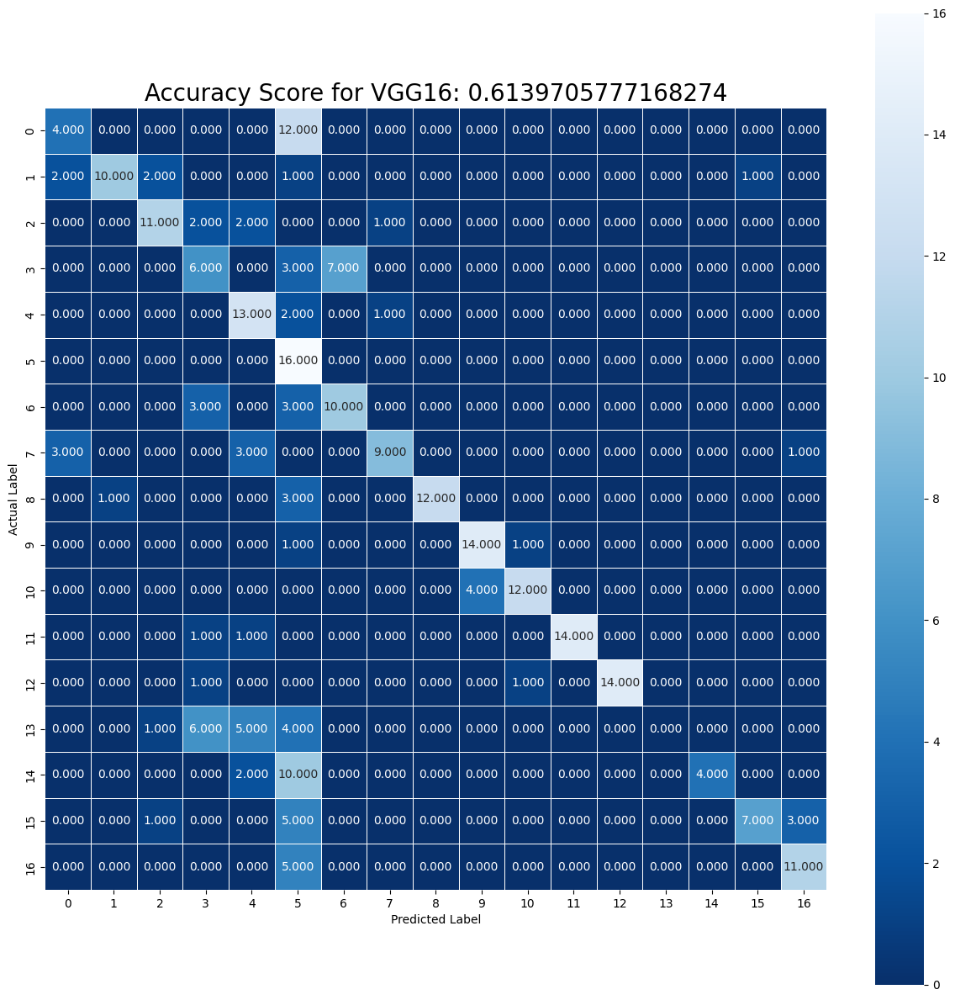

In [87]:
# Confusion Matrix

cm = confusion_matrix(y_test_cat,y_pred_vgg16)
plt.figure(figsize=(15,15))
sns.heatmap(cm, annot = True, fmt = '.3f', linewidths = .5, square = True, cmap='Blues_r')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
all_sample_title = 'Accuracy Score for VGG16: {0}'.format(model.evaluate(X_test_new, y_test_new, verbose=0)[1])
plt.title(all_sample_title, size = 20)

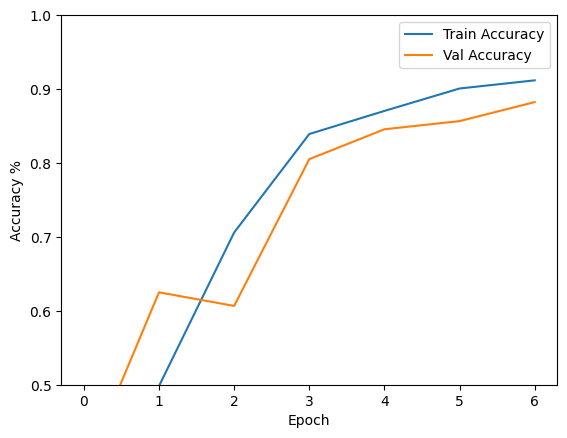

In [88]:
# plot the accuracy history
import matplotlib.pyplot as plt
def plot_history(history):
 plt.figure()
 plt.xlabel('Epoch')
 plt.ylabel('Accuracy %')
 plt.plot(history.epoch, np.array(history.history['acc']),
 label='Train Accuracy')
 plt.plot(history.epoch, np.array(history.history['val_acc']),
 label = 'Val Accuracy')
 plt.legend()
 plt.ylim([0.5, 1])
plot_history(history)

In [89]:
# Adding Final accuracy value to Results DataFrame
tempResultsDf = pd.DataFrame({'Model':['CNN w/ Transfer Learning'],'Accuracy': model.evaluate(X_test_new, y_test_new, verbose=0)[1]},index=[4])
resultsdf = pd.concat([resultsdf, tempResultsDf])

### Compare the results from the above step along with your detailed observations.

In [90]:
resultsdf

,Model,Accuracy
1,MultinomialNB,0.400735
3,CNN,0.621324
4,CNN w/ Transfer Learning,0.613971


In [ ]:
flower_path = '/content/gdrive/MyDrive/Colab/Computer Vision/CNN-Flower-dataset/Flowers - Classification/'  #Destination path where the data

In [92]:
best_flower_model = model

In [96]:
#@title # CLASSIFIER GUI - Great Learning {run: 'auto'}
print('Select the image from Import_Data drop down and click Predict')
#@markdown Step 1: File Name
Import_Data = 'prediction.jpg' #@param [' ', 'prediction.jpg'] {allow-input: true}

#@markdown ## Image Classifier

#Visualize the prediction image
predict_imgpath = '/content/gdrive/MyDrive/Education/GL_Data/Prediction/Prediction1.jpg'
#print(predict_imgpath)

import ipywidgets as widgets
from IPython.display import display

button = widgets.Button(description='Predict')
output = widgets.Output()

def on_button_clicked(b):
  with output:
    plt.subplots(1)
    img = Image.open(predict_imgpath)
    plt.axis('off')
    plt.imshow(img)
    plt.show()

    # Predict the flower class
    img = cv2.imread(predict_imgpath)
    img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
    img = np.expand_dims(img, axis=0)
    print(img.shape)
    pred = best_flower_model.predict(img)
    print('Predicted Class: ', flowers[pred.argmax()])

button.on_click(on_button_clicked)
display(button, output)

Select the image from Import_Data drop down and click Predict


Button(description='Predict', style=ButtonStyle())

Output()

In [102]:
!pip install flowers
import flowers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.8/100.8 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 6.3 MB/s eta 0:00:00


In [109]:
!pip install scikit-learn
import sklearn
from sklearn.datasets import load_iris

In [111]:
from sklearn.preprocessing import LabelEncoder

In [106]:
pred = best_flower_model.predict(img)[0].tolist()#Convert the prediction result to a list:

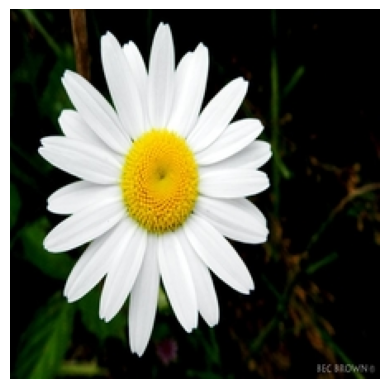

(1, 224, 224, 3)
[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]


In [120]:
#Visualize the prediction image
IMAGE_SIZE = 224
predict_imgpath = '/content/gdrive/MyDrive/Education/GL_Data/Prediction/Prediction1.jpg'
#print(predict_imgpath)

plt.subplots(1)
img = Image.open(predict_imgpath)
plt.axis('off')
plt.imshow(img)
plt.show()

# Predict the flower class
img = cv2.imread(predict_imgpath)
img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
img = np.expand_dims(img, axis=0)
print(img.shape)

pred = best_flower_model.predict(img)
#print('Predicted Class: ', flowers[pred.argmax()])
print(pred)

In [116]:
print(pred[0].max())

1.0


In [117]:
print(pred)

[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]


## **Analysis**:

1. In the evaluation of various models, it is evident that MultinomialNB, a supervised algorithm, performs less favorably by yielding the lowest score. This underscores a notable limitation in supervised learning models, particularly in handling 3D space distances and extracting features from images. As a remedy, flattening the data before inputting it into the model becomes imperative to navigate these challenges effectively.

2. A proactive measure against potential overfitting in both Artificial Neural Networks (ANN) and Convolutional Neural Networks (CNN) is the introduction of the ImageDataGenerator early in the modeling process. This strategy helps enhance the model's ability to generalize by generating augmented training data, thereby mitigating overfitting issues.

3. In contrast to supervised learning, ANN and Deep Neural Nets demonstrate superiority in feature extraction, leading to improved accuracy. However, a drawback emerges as the number of weights increases with each additional layer. This phenomenon results in heightened computational intensity and the loss of neighborhood information in dense layers, contributing to observed overfitting despite achieving only moderate accuracy.

4. CNN outperforms ANN in accuracy, leveraging the "Conv2D" layer specifically designed for image feature extraction. Despite the model's commendable performance, the dense layer's limitation in retaining neighborhood information constrains further accuracy improvement. As a result, the model achieves a moderate accuracy level despite its noteworthy capabilities.

5. Acknowledging the importance of transfer learning, the utilization of pretrained models on extensive datasets becomes crucial for enhancing accuracy. This approach allows leveraging knowledge gained from one task to improve performance on a related task, even with a limited dataset.

6. The deployment of VGG16, pretrained on the ImageNet dataset, with the last four layers unfrozen, showcases a noteworthy model. While overfitting is observed, the model attains notably high accuracy, emphasizing the efficacy of leveraging pretrained models for specific tasks.

7. Effectively addressing overfitting in CNN with transfer learning involves proper hyperparameter tuning. Techniques such as ImageDataGenerator, Dropout layers, optimal optimizer selection, and kernel regularizers play a crucial role in achieving a well-balanced model with high accuracy. This comprehensive approach ensures that the benefits of transfer learning are maximized while mitigating potential pitfalls associated with overfitting.